## **End to End Mutlti Class Dog Breed Classification**
This notebook builds an end to end  multi class image classifier using TensorFlow 2.0 and TensorFlow Hub

### **1. Problem**
Identifying the breed of a dogs given an image of a dog.
When I'm sitting in a cafe and I take a photo of a dog, I want to know what breed dog it is.

### **2. Data**
The data we are using is from kaggle dog breed identification competition
https://www.kaggle.com/competitions/dog-breed-identification/data

### **3. Evaluation**
The evaluation is a file with prediction probabilities for each dog breed of each test image.
https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

### **4. Features**
Some information about the data:
* we are dealing with image (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).

In [1]:
# Unzip the uploaded data in Google Drive
#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision"

### Get our workspace ready

* Import TensorFlow 2.0 
* Import TensorFlow Hub
* Make sure we're using a GPU

In [2]:
# Import TensorFlow into Colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF Version:",tf.__version__)
print("TF Hub Version:",hub.__version__)

# Check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "Not available")

TF Version: 2.8.2
TF Hub Version: 0.12.0
GPU available


### Getting the data ready (turning into Tensors)

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning into Tensors (numerical representations).

Let's start by accessing our data and checking out the labels.

In [3]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [4]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [5]:
# How many images are there for each breed?
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

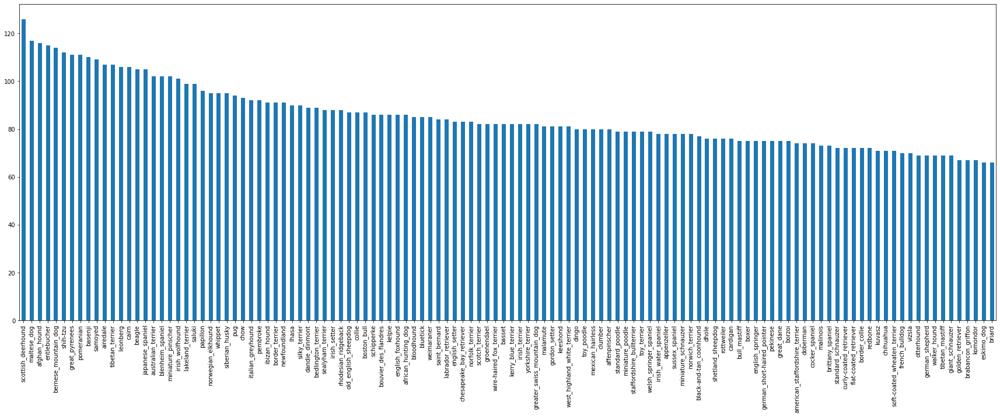

In [6]:
labels_csv["breed"].value_counts().plot.bar(figsize = (30,10));

In [7]:
labels_csv["breed"].value_counts().median()

82.0

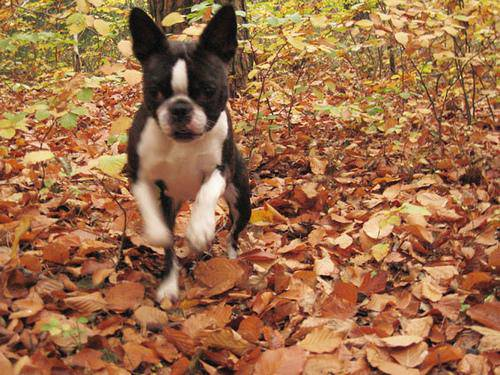

In [8]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

### Getting images and their labels

Let's get a list of all of our image file pathnames.

In [9]:
# Create pathnames from image ID's
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [10]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files.")
else:
  print("Filenames do not match actual amount of files, please check the target directory.")

Filenames match actual amount of files.


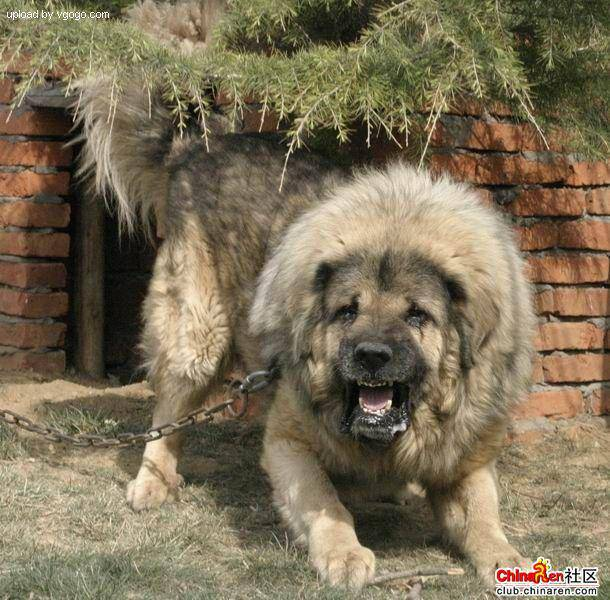

In [11]:
# One more check
Image(filenames[9000])

In [12]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, let's prepare our labels

In [13]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [14]:
len(labels)

10222

In [15]:
# Check if the number of labels matching with the number of filenames
if len(labels) == len(filenames):
   print("Number of Filenames match number of labels.")
else:
  print("Number of Filenames doest not match number of labels.")

Number of Filenames match number of labels.


In [16]:
# Find the unique labels values
unique_breeds = np.unique(labels)

In [17]:
len(unique_breeds)

120

In [18]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [19]:
# Turn every label into boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [20]:
len(boolean_labels)

10222

In [21]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs


boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [22]:
# Example: Turning boolean array into integers
print(labels[2]) # original label
print(np.where(unique_breeds == labels[2])) # index where label occurs
print(boolean_labels[2].argmax()) # index where label occurs in boolean array
print(boolean_labels[2].astype(int)) # there will be a 1 where the sample label occurs

pekinese
(array([85]),)
85
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [23]:
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set
Since the dataset from kaggle doesn't come with a validation sets, we are going to create our own.

In [24]:
# Setup x & y variables
x = filenames
y = boolean_labels

We're going to start experimentating with 1000 images and increase as needed.

In [25]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type: "slider", min:1000, max:10000, step: 1000}

In [26]:
# Import train_test_split from Scikit-Learn
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES], 
                                                  test_size=0.2,
                                                  random_state=42)

len(x_train), len(y_train), len(x_val), len(y_val)

(800, 800, 200, 200)

In [27]:
# Check out the training data (image file paths and labels)
x_train[:5], y_train[:2]


(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

### Preprocessing Images (Turning images into Tensors)
To preprocess our images into Tensors we're going to write a function which does a few things:
* Take a image filepath as inputh
* Use TensorFlow to read the file and save it to a variable, `image`
* Turn our `image` (a jpeg file) into Tensors
* Normalize the image
* Resize the `image` to be a shape of (224, 224)
* Return the modified `image`

Before we do, Let's see what importing an image looks like.

In [28]:
# Convert image to Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [29]:
image.max(),image.min()

(255, 0)

In [30]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [31]:
# Turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now we've seen what an image looks like a Tensor, let's make a function to preprocess them.

In [32]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path):
  """
  Take an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn jpeg image into numerical Tensors with 3 colour channels(Read, Green, Blue)
  image = tf.image.decode_jpeg(image,channels = 3) 

  # Convert the color channels values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desired value (224,224)
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches
Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go then they all might not fit into memory.

So that's why we do about 32 (this is the batch size) image at a time (you can manually adjust the batch size if need be).

In order to use tensorFlow effectively, we need to our data in the form of Tensor Tuples which look like: `(image, label)`

In [33]:
# Create a simple function to return a tuple (image, label)
def get_image_label (image_path, label):
  """
  Takes an image file path name and the associated label, processes the image and returns a typle of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [34]:
# Demo of the above
(process_image(x[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we have got a way to turn our data into tuples of Tensors in the form: `(image, label)`, Let's make a function to turn all our data (x & y) into batches!

In [35]:
# Define the batch size, 32 is good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x,y = None, size = BATCH_SIZE, valid_data = False, test_data = False):
  """
  Create batches of data out of the image (x) and label(y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accept test data as input (no labels).
  """
  # If the data is a test data set, we probably don't have labels
  if test_data:
    print("Creating test data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid data set, we don't need to shuffle
  elif valid_data:
    print("Creating validation data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                                tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches")

    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                                tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size = len(x))
    # Create (image, label) tuples (this also turn the image path into a preprocessed image)
    data = data.map(get_image_label)
    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [36]:
# Create training and validation data batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data = True)


Creating training data batches
Creating validation data batches


In [37]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))


## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!


In [38]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image 
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [39]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

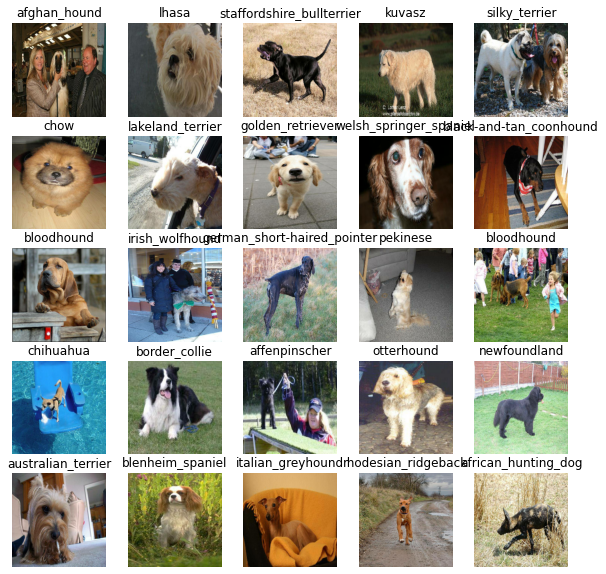

In [40]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

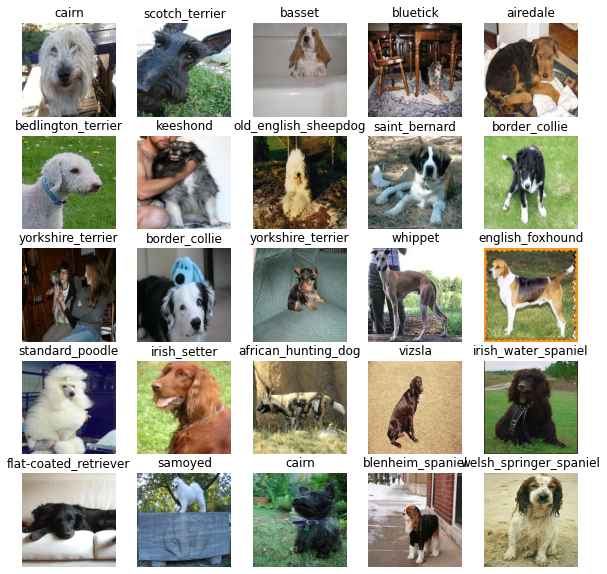

In [41]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:

  The input shape (our images shape, in the form of Tensors) to our model.

  The output shape (image labels, in the form of Tensors) of our model.
  
  The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [42]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:

* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [43]:
# Create a function which builds a keras model
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units = OUTPUT_SHAPE,
                            activation = "softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [44]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


### Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

## TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:

* Load the TensorBoard notebook extension ✅
* Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function. ✅
* Visualize our models training logs with the %tensorboard magic function (we'll do this after model training).

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard

In [45]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [46]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

## Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping


In [47]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [48]:
NUM_EPOCHS = 100 #@param{type: "slider", min: 10, max: 100}

In [49]:
# Check to make sure we're still running in a GPU
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


## Let's create a function which train a model
* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number od epochs to train for `(NUM_EPOCHS)` and the callback we'd like to use
* Return the model

In [50]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """

  # Create a model
  model = create_model()

  # Create new Tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks 
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])
  
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 17s 318ms/step - loss: 4.5891 - accuracy: 0.1013 - val_loss: 3.4123 - val_accuracy: 0.2750
Epoch 2/100
25/25 [==============================] - 3s 124ms/step - loss: 1.6171 - accuracy: 0.6988 - val_loss: 2.2094 - val_accuracy: 0.5000
Epoch 3/100
25/25 [==============================] - 3s 122ms/step - loss: 0.5639 - accuracy: 0.9337 - val_loss: 1.7229 - val_accuracy: 0.5900
Epoch 4/100
25/25 [==============================] - 3s 123ms/step - loss: 0.2490 - accuracy: 0.9875 - val_loss: 1.5323 - val_accuracy: 0.6150
Epoch 5/100
25/25 [==============================] - 4s 149ms/step - loss: 0.1460 - accuracy: 0.9987 - val_loss: 1.4468 - val_accuracy: 0.6350
Epoch 6/100
25/25 [==============================] - 3s 121ms/step - loss: 0.0993 - accuracy: 0.9987 - val_loss: 1.4033 - val_accuracy: 0.6500
Epoch 7/100
25/25 [=============================

### Checking the TensorBoard logs

The TensorBoard magic function (%tensorboard) will access the logs directory we created earlier and visualize its contents.


In [51]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [52]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [53]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 20s 2s/step


array([[0.00422907, 0.00048985, 0.0082278 , ..., 0.01297448, 0.00759461,
        0.00594603],
       [0.00678754, 0.00043484, 0.01451062, ..., 0.0010564 , 0.00271644,
        0.00297841],
       [0.00235868, 0.00245886, 0.00087716, ..., 0.00033927, 0.00179881,
        0.00030127],
       ...,
       [0.010399  , 0.0010545 , 0.0004539 , ..., 0.00035123, 0.01247018,
        0.00282548],
       [0.0034195 , 0.00263468, 0.00373243, ..., 0.00157347, 0.00598133,
        0.00746444],
       [0.00298776, 0.00058333, 0.00016144, ..., 0.00129494, 0.00485912,
        0.01456713]], dtype=float32)

In [54]:
predictions[0]

array([4.2290711e-03, 4.8984634e-04, 8.2278000e-03, 2.5466441e-03,
       6.0958527e-03, 1.0772946e-03, 3.0675048e-02, 1.6863210e-01,
       3.8890450e-03, 3.5796084e-02, 4.3012458e-03, 6.9465013e-03,
       2.8780233e-03, 2.0239225e-02, 2.2199189e-03, 1.4415359e-02,
       2.6997408e-02, 1.1302198e-04, 3.9123069e-03, 2.5979804e-03,
       6.9714448e-04, 5.8653072e-04, 4.4172956e-03, 1.0247536e-02,
       2.7134877e-03, 3.3199773e-04, 1.7913305e-03, 2.1506865e-03,
       5.8003715e-03, 1.1394494e-03, 6.8474078e-04, 3.5629394e-03,
       6.5402006e-04, 1.2247245e-02, 8.7510460e-05, 1.1632990e-03,
       1.0822188e-02, 1.7183946e-03, 1.5713841e-04, 1.7406994e-04,
       9.6973073e-04, 1.4550713e-02, 1.3066225e-03, 2.4934887e-04,
       1.3336507e-03, 1.8988257e-02, 2.4694149e-04, 1.9609183e-03,
       1.6004285e-02, 1.2403158e-02, 1.7707659e-02, 3.9818319e-03,
       3.5377974e-03, 1.6074661e-02, 8.0603274e-04, 3.6147735e-03,
       6.8524957e-04, 1.4509799e-02, 1.4814144e-02, 1.2386548e

In [55]:
predictions.shape

(200, 120)

In [56]:
len(predictions)

200

In [57]:
len(y_val)

200

In [58]:
len(unique_breeds)

120

In [59]:
sum(predictions[0])

0.9999999444771674

In [60]:
# First prediction
index = 0
print(predictions[0])
print(f"Max Value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[4.2290711e-03 4.8984634e-04 8.2278000e-03 2.5466441e-03 6.0958527e-03
 1.0772946e-03 3.0675048e-02 1.6863210e-01 3.8890450e-03 3.5796084e-02
 4.3012458e-03 6.9465013e-03 2.8780233e-03 2.0239225e-02 2.2199189e-03
 1.4415359e-02 2.6997408e-02 1.1302198e-04 3.9123069e-03 2.5979804e-03
 6.9714448e-04 5.8653072e-04 4.4172956e-03 1.0247536e-02 2.7134877e-03
 3.3199773e-04 1.7913305e-03 2.1506865e-03 5.8003715e-03 1.1394494e-03
 6.8474078e-04 3.5629394e-03 6.5402006e-04 1.2247245e-02 8.7510460e-05
 1.1632990e-03 1.0822188e-02 1.7183946e-03 1.5713841e-04 1.7406994e-04
 9.6973073e-04 1.4550713e-02 1.3066225e-03 2.4934887e-04 1.3336507e-03
 1.8988257e-02 2.4694149e-04 1.9609183e-03 1.6004285e-02 1.2403158e-02
 1.7707659e-02 3.9818319e-03 3.5377974e-03 1.6074661e-02 8.0603274e-04
 3.6147735e-03 6.8524957e-04 1.4509799e-02 1.4814144e-02 1.2386548e-03
 1.4228945e-02 5.8141019e-04 1.0704948e-03 9.3903713e-02 3.5971929e-03
 6.9641122e-03 5.1070988e-04 4.5991875e-03 5.5753668e-03 1.7053347e-02
 8.090

In [61]:
unique_breeds[26]

'cairn'

Having the above functionality is great but we want to be able to do it at scale.

And it would be better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also know as confidence levels.

In [62]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label (prediction_probabilities):
  """
  Turns an array of predictions into a label.

  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'basenji'

In [63]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [64]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:

* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visaulize.

We'll create a function which:

* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.



In [65]:
def plot_pred (prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot the image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  
  # Change the color
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title ("{} {:2.0f}% {}".format(pred_label,
                                     np.max(pred_prob)*100,
                                     true_label),
                                     color = color)

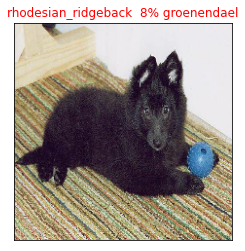

In [66]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:

* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using get_pred_label()
* Find the top 10:
    * Prediction probabilities indexes
    * Prediction probabilities values
    * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [67]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 predictions confidence index
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 predictions confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 predictions labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")
  
   # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

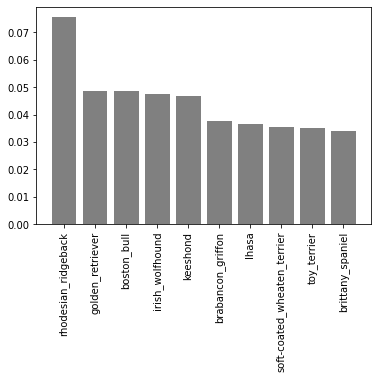

In [68]:
plot_pred_conf(prediction_probabilities=predictions,
          labels=val_labels,
          n=77)

Now we've got some function to help us visualize our predictions and evaluate our modle, let's check out a few.

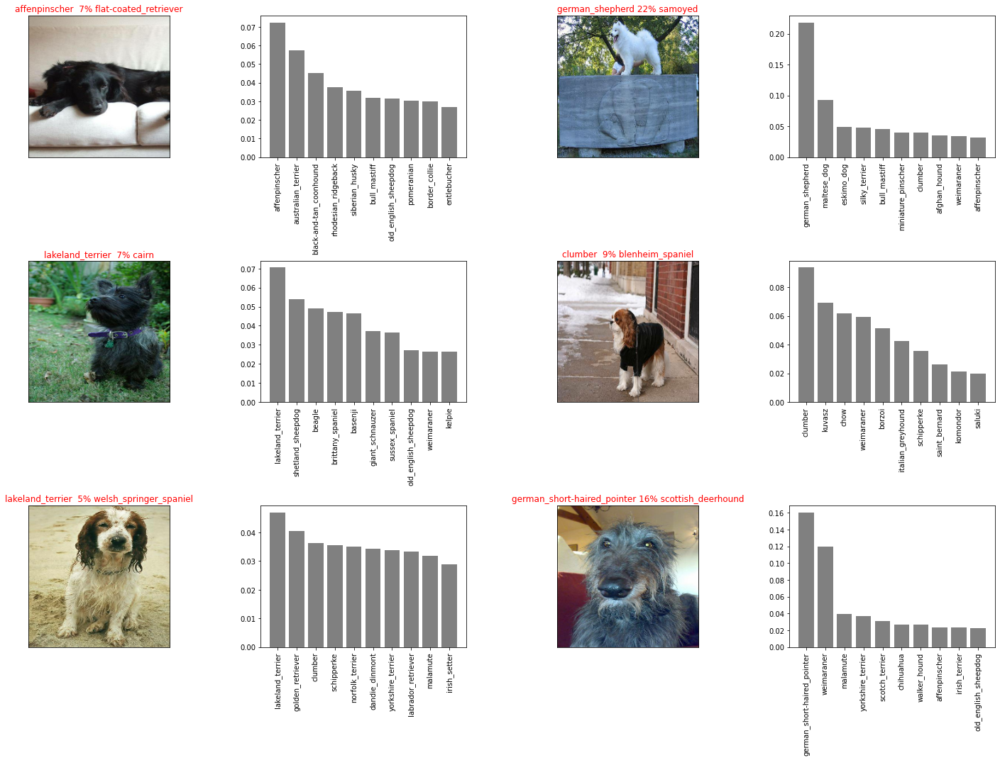

In [69]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

### Saving and reloading a trained model

In [70]:
# Create a function to save a model
def save_model(model, suffix = None):
  """
  Save a given model in a models directory and appends a suffix (string).
  """

  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix +".h5" # Save format of model
  print(f"Saving model to: {model_path}")
  model.save(model_path)
  return model_path

In [71]:
# Create a function to load a train model
def load_model(model_path):
  """
  Load a sve model from a specified path.
  """
  print(f"Loading a sve model: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                    custom_objects = {"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20220918-14501663512640-1000-images-mobilenetv2-Adam.h5


'drive/MyDrive/Dog Vision/models/20220918-14501663512640-1000-images-mobilenetv2-Adam.h5'

In [74]:
# Load a trained model
loaded_1000_image_model = load_model('drive/MyDrive/Dog Vision/models/20220918-09491663494564-1000-images-mobilenetv2-Adam.h5')

Loading a sve model: drive/MyDrive/Dog Vision/models/20220918-09491663494564-1000-images-mobilenetv2-Adam.h5


In [75]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 80ms/step - loss: 5.7399 - accuracy: 0.0050


[5.7398881912231445, 0.004999999888241291]

In [76]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 90ms/step - loss: 1.2411 - accuracy: 0.7000


[1.241085171699524, 0.699999988079071]

### Training a big dog model (on the full dataset)

In [77]:
len(x), len(y)

(10222, 10222)

In [78]:
# Create a data batch with the full data set
full_data = create_data_batches(x, y)

Creating training data batches


In [79]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [80]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [81]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "accuracy",
                                                             patience = 3)

**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x = full_data,
               epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard,full_model_early_stopping]) 

Epoch 1/100
320/320 [==============================] - 39s 110ms/step - loss: 1.3366 - accuracy: 0.6676
Epoch 2/100
320/320 [==============================] - 34s 105ms/step - loss: 0.3976 - accuracy: 0.8863
Epoch 3/100
320/320 [==============================] - 34s 106ms/step - loss: 0.2321 - accuracy: 0.9386
Epoch 4/100
320/320 [==============================] - 34s 106ms/step - loss: 0.1522 - accuracy: 0.9648
Epoch 5/100
320/320 [==============================] - 34s 106ms/step - loss: 0.1063 - accuracy: 0.9786
Epoch 6/100
320/320 [==============================] - 34s 106ms/step - loss: 0.0767 - accuracy: 0.9873
Epoch 7/100
320/320 [==============================] - 35s 109ms/step - loss: 0.0569 - accuracy: 0.9927
Epoch 8/100
320/320 [==============================] - 36s 114ms/step - loss: 0.0467 - accuracy: 0.9938
Epoch 9/100
320/320 [==============================] - 38s 118ms/step - loss: 0.0383 - accuracy: 0.9956
Epoch 10/100
320/320 [==============================] - 36s 113m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20220918-15061663513563-full-image-set-mobilenetv2-Adam.h5


'drive/MyDrive/Dog Vision/models/20220918-15061663513563-full-image-set-mobilenetv2-Adam.h5'

In [82]:
# Load in the full model
loaded_full_model = load_model('drive/MyDrive/Dog Vision/models/20220918-15061663513563-full-image-set-mobilenetv2-Adam.h5')

Loading a sve model: drive/MyDrive/Dog Vision/models/20220918-15061663513563-full-image-set-mobilenetv2-Adam.h5


## Making prediction on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:

* Get the test image filenames.
* Convert the filenames into test data batches using `create_data_batches()` and setting the test_data parameter to True (since the test data doesn't have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model.


In [83]:
# Load test image filenames
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10] 

['drive/MyDrive/Dog Vision/test/e06fdea86b416e992137ad52bb5da5a8.jpg',
 'drive/MyDrive/Dog Vision/test/e2b808864a5253fd356a9032915447a1.jpg',
 'drive/MyDrive/Dog Vision/test/e5ad4cc7818e4eed04d209da177afa6f.jpg',
 'drive/MyDrive/Dog Vision/test/dd9d222a481e6cbea922a1b601a55a38.jpg',
 'drive/MyDrive/Dog Vision/test/dfc5d207b533d381045984a0a0adb23c.jpg',
 'drive/MyDrive/Dog Vision/test/deb063345bf2b6752e2fe25cad096547.jpg',
 'drive/MyDrive/Dog Vision/test/e119301e11d4f1620948c3e6f5a3f021.jpg',
 'drive/MyDrive/Dog Vision/test/dfc41d3f135d49a41e7b796883ff030e.jpg',
 'drive/MyDrive/Dog Vision/test/e2628b6bde028b5eb593616128728907.jpg',
 'drive/MyDrive/Dog Vision/test/e145bbebb9ad1e740256e460899a6b67.jpg']

In [84]:
len(test_filenames)

10357

In [85]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data = True)

Creating test data batches


In [86]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about a ~1hr). This is because we have to process ~10,000+ images and get our model to find patterns in those images and generate predictions based on what its learned in the training dataset.

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 1162s 4s/step


In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [87]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[2.10199349e-12, 8.82413858e-08, 1.39859576e-05, ...,
        3.71373229e-04, 1.74519710e-06, 6.19773070e-12],
       [4.29673941e-09, 1.70838357e-05, 4.91808905e-08, ...,
        2.23783081e-05, 1.04748558e-07, 2.18551719e-08],
       [3.13173025e-08, 2.16161425e-06, 1.15418874e-08, ...,
        3.79525125e-04, 5.11393118e-05, 6.54531618e-07],
       ...,
       [3.11745241e-10, 1.79688868e-06, 2.16518678e-10, ...,
        3.39545545e-06, 2.02523847e-08, 1.26917554e-09],
       [5.71547565e-09, 2.07597473e-09, 8.25417956e-09, ...,
        1.39367439e-05, 1.18230552e-07, 1.10780547e-05],
       [2.25274754e-09, 1.39735548e-08, 4.70162353e-10, ...,
        1.10466525e-09, 1.05747000e-09, 3.21167164e-07]])

In [88]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed. https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilites) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.



In [89]:
# Create a pandas DataFrame with empty columns
import pandas as pd
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [90]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [91]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e06fdea86b416e992137ad52bb5da5a8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e2b808864a5253fd356a9032915447a1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e5ad4cc7818e4eed04d209da177afa6f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,dd9d222a481e6cbea922a1b601a55a38,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,dfc5d207b533d381045984a0a0adb23c,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [92]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e06fdea86b416e992137ad52bb5da5a8,2.101993e-12,8.824139e-08,1.398596e-05,9.666280e-11,5.556219e-10,1.171196e-10,2.306422e-09,1.129045e-06,3.426484e-10,...,4.033906e-10,1.795626e-06,2.864351e-09,2.037348e-09,1.106488e-06,2.932552e-08,2.330167e-09,3.713732e-04,1.745197e-06,6.197731e-12
1,e2b808864a5253fd356a9032915447a1,4.296739e-09,1.708384e-05,4.918089e-08,6.657104e-09,1.432938e-09,2.032064e-04,4.914872e-08,8.151618e-05,4.031675e-08,...,1.692097e-07,9.013957e-08,6.398427e-08,7.738705e-07,3.821316e-08,2.166553e-09,6.095761e-09,2.237831e-05,1.047486e-07,2.185517e-08
2,e5ad4cc7818e4eed04d209da177afa6f,3.131730e-08,2.161614e-06,1.154189e-08,7.642769e-07,8.109948e-04,1.226705e-05,1.616835e-07,2.916417e-06,4.946055e-08,...,9.122804e-07,1.982183e-06,6.481901e-01,4.252680e-04,4.806905e-06,1.296480e-07,6.580321e-09,3.795251e-04,5.113931e-05,6.545316e-07
3,dd9d222a481e6cbea922a1b601a55a38,5.275894e-09,2.391447e-08,8.385330e-08,1.298691e-11,1.575830e-08,1.121751e-08,2.909468e-08,3.181395e-08,2.162576e-10,...,2.246912e-08,1.069225e-08,1.256867e-09,4.649671e-08,4.540930e-08,4.912741e-10,3.046170e-07,1.980688e-09,3.469203e-08,1.322870e-09
4,dfc5d207b533d381045984a0a0adb23c,9.690063e-10,3.712998e-11,4.598546e-09,3.453884e-11,1.413676e-09,3.703446e-09,2.740145e-10,5.859060e-08,2.099411e-11,...,8.156735e-11,6.746216e-09,6.056140e-11,1.994671e-10,4.938443e-09,3.976936e-11,1.686942e-08,1.603528e-10,2.148363e-09,1.237759e-10


In [93]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

### Making predictions on custom images

To make predictions on custom images, we'll:

* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the test_data parameter to True.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [96]:
# Get custom image filepaths
custom_path = "drive/My Drive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [97]:
custom_image_paths

['drive/My Drive/Dog Vision/my-dog-photos/dog_photo_6.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/dog_photo_4.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/dog_photo_3.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/dog_photo_5.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/dog_photo_1.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/dog_photo_2.jpg']

In [99]:
# Turn custom images into batch datasets 
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [100]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

In [101]:
custom_preds.shape

(6, 120)

In [102]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['eskimo_dog',
 'golden_retriever',
 'samoyed',
 'malinois',
 'german_shepherd',
 'pembroke']

In [103]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

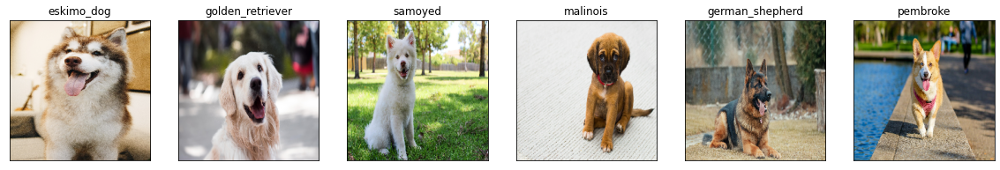

In [106]:
# Check custom image predictions
plt.figure(figsize=(20, 20))
for i, image in enumerate(custom_images):
  plt.subplot(1, 6, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)